In [1]:
import os
import numpy as np
import pandas as pd
from tabulate import tabulate
from sklearn.metrics.pairwise import cosine_similarity

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
import statsmodels.formula.api as smf

In [2]:
data_path = r"C:\Projects\connecteddatahub\data"
academic_programs_path = os.path.join(data_path, 'external', 'university_academics_program_percent.csv')
academic_programs_df = pd.read_csv(academic_programs_path)
academic_programs_df['Year'] = academic_programs_df['year']
academic_programs_df['AffiliationId'] = academic_programs_df['AffiliationId'].astype(int)
academic_programs_df.columns

Index(['carnegie_id', 'AffiliationId', 'year',
       'academics.program_percentage.agriculture',
       'academics.program_percentage.resources',
       'academics.program_percentage.architecture',
       'academics.program_percentage.ethnic_cultural_gender',
       'academics.program_percentage.communication',
       'academics.program_percentage.communications_technology',
       'academics.program_percentage.computer',
       'academics.program_percentage.personal_culinary',
       'academics.program_percentage.education',
       'academics.program_percentage.engineering',
       'academics.program_percentage.engineering_technology',
       'academics.program_percentage.language',
       'academics.program_percentage.family_consumer_science',
       'academics.program_percentage.legal',
       'academics.program_percentage.english',
       'academics.program_percentage.humanities',
       'academics.program_percentage.library',
       'academics.program_percentage.biological',
    

In [3]:
edge_path = os.path.join(data_path, 'interlocks', 'interlock_edges.csv')
node_path = os.path.join(data_path, 'interlocks', 'interlock_nodes.csv')

edge_df = pd.read_csv(edge_path)
node_df = pd.read_csv(node_path)

node_df = node_df[node_df['Year'] >= 2001]

print(f"Edge df cols: {edge_df.columns}\n")
print(f"Node df cols: {node_df.columns}")

Edge df cols: Index(['Year', 'AffiliationId_1', 'Institution_1', 'AffiliationId_2',
       'Institution_2', 'InterlockCount', 'BoardSize_1', 'BoardSize_2',
       'WeightNorm', 'Weakness', 'Source', 'Target', 'Weight',
       'EdgeEntropyBits'],
      dtype='object')

Node df cols: Index(['Year', 'Id', 'Label', 'SystemId', 'degree', 'degree_centrality',
       'eigenvector_centrality', 'betweenness_centrality', 'clustering',
       'modularity_class', 'interlock_entropy_bits', 'strength', 'Institution',
       'AffiliationId'],
      dtype='object')


In [4]:
print(node_df['AffiliationId'].dtype, academic_programs_df['AffiliationId'].dtype)
print(node_df['Year'].dtype, academic_programs_df['Year'].dtype)

nodes_programs_df = pd.merge(
    left=node_df,
    right=academic_programs_df,
    on = ['AffiliationId', 'Year'],
    how = 'left'
)

# print(tabulate(nodes_programs_df, headers='keys', tablefmt='psql'))

int64 int64
int64 int64


In [5]:
'''
extract the academic program cols and remove any entries in the df that are all nan
'''
subset_cols = [c for c in nodes_programs_df.columns if c.startswith("academics")]
# filter out any entries that have nan for every single col
nodes_programs_df = nodes_programs_df.dropna(subset = subset_cols, how = 'all')
print(tabulate(nodes_programs_df, headers='keys', tablefmt='psql'))

+-----+--------+-----------+-----------------------------------------------------+----------------+----------+---------------------+--------------------------+--------------------------+--------------+--------------------+--------------------------+------------+-----------------------------------------------------+-----------------+---------------+--------+--------------------------------------------+------------------------------------------+---------------------------------------------+-------------------------------------------------------+----------------------------------------------+----------------------------------------------------------+-----------------------------------------+--------------------------------------------------+------------------------------------------+--------------------------------------------+-------------------------------------------------------+-----------------------------------------+--------------------------------------------------------+---------

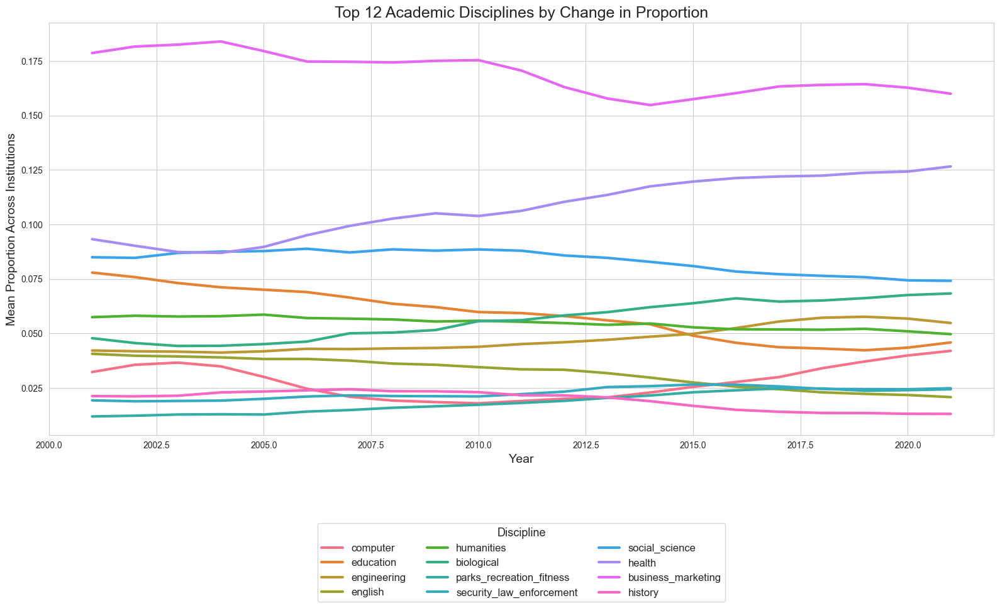


Disciplines with greatest change over time:

                            min    max  Change
Discipline                                    
health                    0.087  0.127   0.040
education                 0.042  0.078   0.036
business_marketing        0.155  0.184   0.029
biological                0.044  0.068   0.024
computer                  0.018  0.042   0.024
english                   0.021  0.041   0.020
engineering               0.041  0.058   0.016
social_science            0.074  0.089   0.015
parks_recreation_fitness  0.012  0.025   0.013
history                   0.013  0.024   0.011


In [6]:
'''
plot the disciplines that change the most in average proportion over the data
'''

mean_by_year = (
    academic_programs_df.groupby("Year")[subset_cols]
    .mean()
    .reset_index()
    .melt(id_vars="Year", var_name="Discipline", value_name="MeanProportion")
)
mean_by_year["Discipline"] = mean_by_year["Discipline"].str.replace("academics.program_percentage.", "", regex=False)


change_summary = (
    mean_by_year.groupby("Discipline")["MeanProportion"]
    .agg(["min", "max"])
    .assign(Change=lambda d: d["max"] - d["min"])
    .sort_values("Change", ascending=False)
)
top_disciplines = change_summary.head(12).index

subset = mean_by_year[mean_by_year["Discipline"].isin(top_disciplines)]

plt.figure(figsize=(16,10))
sns.set_style("whitegrid")

sns.lineplot(
    data=subset,
    x="Year", y="MeanProportion", hue="Discipline",
    linewidth=3
)

plt.title("Top 12 Academic Disciplines by Change in Proportion", fontsize=18)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Mean Proportion Across Institutions", fontsize=14)
plt.legend(
    title="Discipline", fontsize=12, title_fontsize=13,
    bbox_to_anchor=(0.5, -0.2), loc="upper center", ncol=3
)
plt.tight_layout()
plt.show()

print("\nDisciplines with greatest change over time:\n")
print(change_summary.head(10).round(3))

In [7]:
'''
extract academic proporation cols from nodes program df
compute the consine similarity between all pairs of insitutions in the df
'''
X = nodes_programs_df[subset_cols].values
X = nodes_programs_df[subset_cols].fillna(0).values
cosine_similarity_x = cosine_similarity(X) 

ids = nodes_programs_df["Institution"].values
cos_sim_df = pd.DataFrame(cosine_similarity_x, index=ids, columns=ids)

print(tabulate(cos_sim_df, headers = 'key', tablefmt='psql'))


+-----------------------------------------------------+----------+-----------+-----------+----------+-------------+----------+----------+----------+-----------+-------------+-----------+-------------+-------------+-----------+-------------+-------------+-------------+----------+-----------+----------+-----------+-----------+-----------+-----------+-----------+-------------+-----------+-----------+----------+-------------+-------------+----------+----------+----------+----------+----------+----------+----------+----------+-----------+----------+----------+----------+----------+-------------+------------+------------+------------+-----------+----------+----------+-----------+-------------+-------------+----------+-------------+----------+-----------+------------+-----------+-----------+-------------+----------+-------------+-----------+-----------+----------+-------------+----------+-----------+----------+-----------+----------+-------------+-----------+-----------+-----------+----------

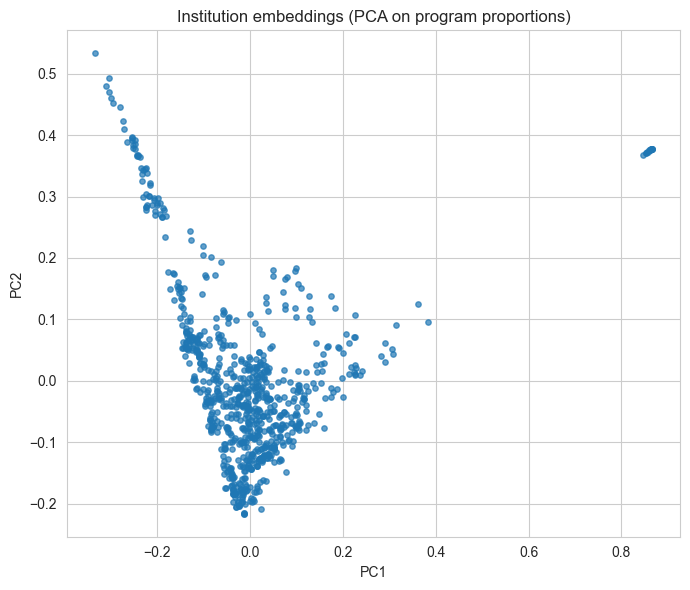

array([0.30482822, 0.23973275])

In [8]:
'''
run pca on the matrix of institutions and plot 2d embedding
points close together are insts with similar distributions.
'''

pca = PCA(n_components=2)
X_2d = pca.fit_transform(X)

plt.figure(figsize=(7,6))
plt.scatter(X_2d[:, 0], X_2d[:, 1], s=15, alpha=0.7)
plt.title("Institution embeddings (PCA on program proportions)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.tight_layout()
plt.show()
pca.explained_variance_ratio_


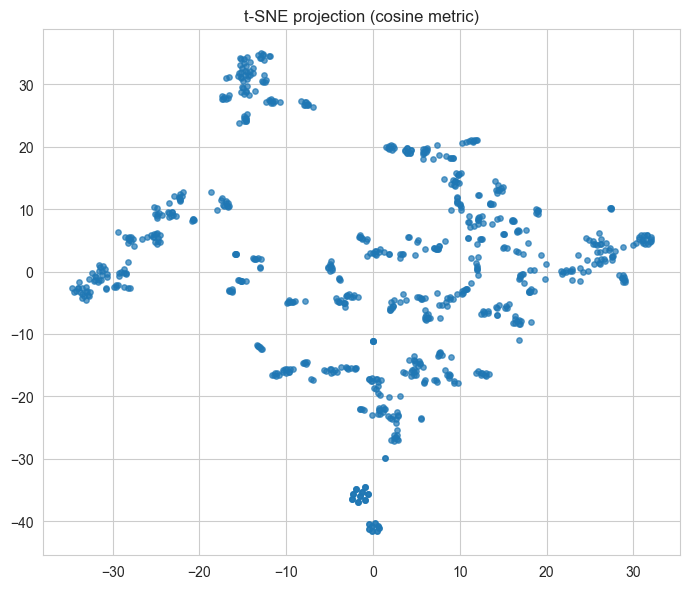

In [9]:
'''
t-sne embedding - similar to pca 
'''

X = nodes_programs_df[subset_cols].fillna(0).values
X_2d = TSNE(n_components=2, metric="cosine", random_state=0).fit_transform(X)

plt.figure(figsize=(7,6))
plt.scatter(X_2d[:, 0], X_2d[:, 1], s=15, alpha=0.7)
plt.title("t-SNE projection (cosine metric)")
plt.tight_layout()
plt.show()


In [10]:
'''
Go through the years, for each year compare cs across all pairs, create a dataframe with these similarities, and also do this for specifically the interlock, then plot it
'''

program_cols = [c for c in nodes_programs_df.columns if c.startswith("academics.program_percentage.")]
years = sorted(set(edge_df["Year"]) & set(nodes_programs_df["Year"]))

records = [] 

# Record the cosine similarity for all institution pairs and just the interlocks, and compare the two
for yr in years:

    year_nodes = nodes_programs_df.loc[nodes_programs_df["Year"] == yr, ["AffiliationId"] + program_cols].copy()
    year_edges = edge_df.loc[edge_df["Year"] == yr, ["AffiliationId_1", "AffiliationId_2"]].copy()

    # Compute cosine similarity across all pairs of insitutions for the year
    X = year_nodes[program_cols].fillna(0).values
    
    ids = year_nodes["AffiliationId"].values
    cos_mat = cosine_similarity(X)
    cos_df = pd.DataFrame(cos_mat, index=ids, columns=ids)

    # only use the upper triangle of the matrix as to not use duplicate points
    idx = np.triu_indices(len(ids), k=1)
    baseline_sims = cos_mat[idx]

    # Extract the interlocks and do CS between these pairs
    year_edges[["AffiliationId_1", "AffiliationId_2"]] = np.sort(
        year_edges[["AffiliationId_1", "AffiliationId_2"]].values, axis=1
    )

    # Flatten to long form
    cos_long = cos_df.stack().reset_index()
    cos_long.columns = ["AffiliationId_1", "AffiliationId_2", "CosineSimilarity"]

    # Normalize ordering
    cos_long[["AffiliationId_1", "AffiliationId_2"]] = np.sort(
        cos_long[["AffiliationId_1", "AffiliationId_2"]].values, axis=1
    )

    # Merge edges with cosine similarities
    merged = year_edges.merge(cos_long, on=["AffiliationId_1", "AffiliationId_2"], how="inner")
    interlock_sims = merged["CosineSimilarity"].to_numpy()

    records.append(pd.DataFrame({
        "Year": yr,
        "Group": "baseline",
        "CosineSimilarity": baseline_sims
    }))
    records.append(pd.DataFrame({
        "Year": yr,
        "Group": "interlock",
        "CosineSimilarity": interlock_sims
    }))

# Combine results across all years
similarity_df = pd.concat(records, ignore_index=True)

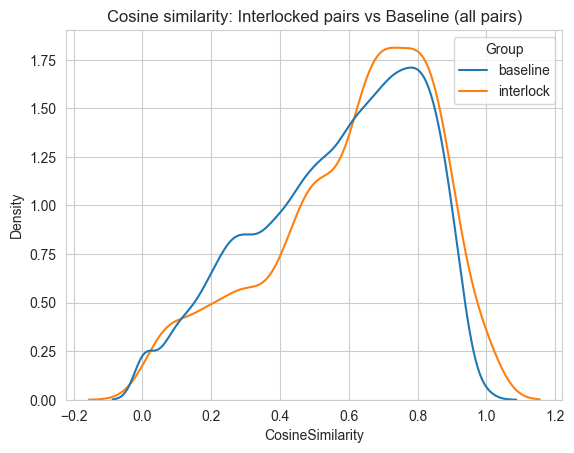

In [11]:
sns.kdeplot(data=similarity_df, x="CosineSimilarity", hue="Group", common_norm=False)
plt.title("Cosine similarity: Interlocked pairs vs Baseline (all pairs)")
plt.show()


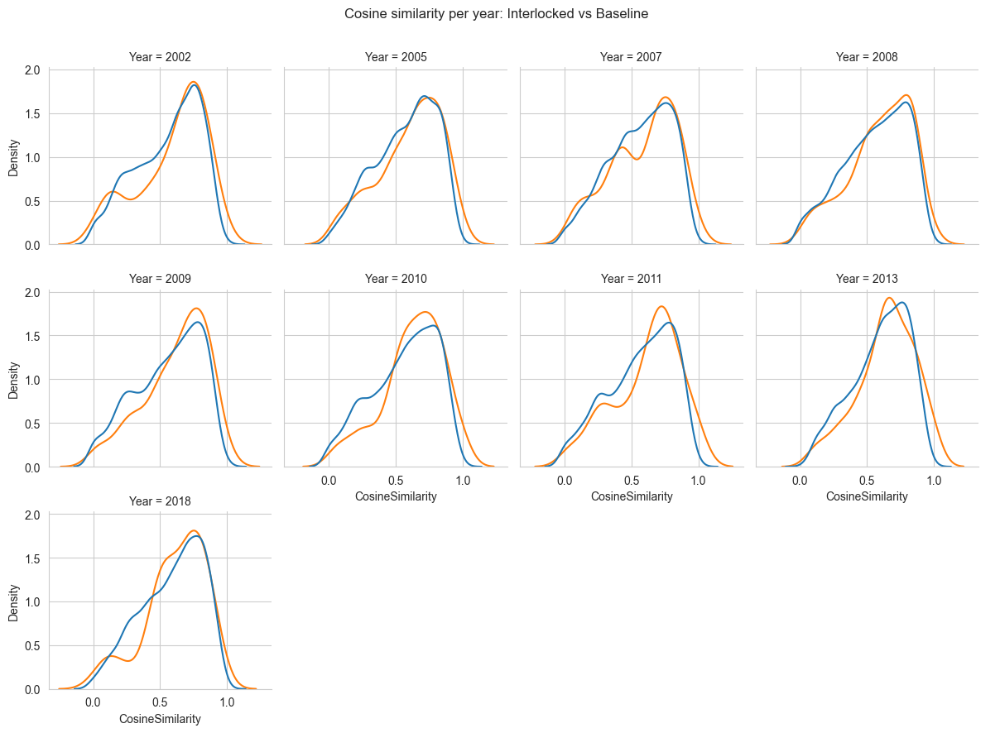

In [12]:
g = sns.FacetGrid(similarity_df, col="Year", col_wrap=4, sharex=True, sharey=True, height=3)
g.map_dataframe(sns.kdeplot, x="CosineSimilarity", hue="Group", common_norm=False)
g.add_legend()
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Cosine similarity per year: Interlocked vs Baseline")
plt.show()

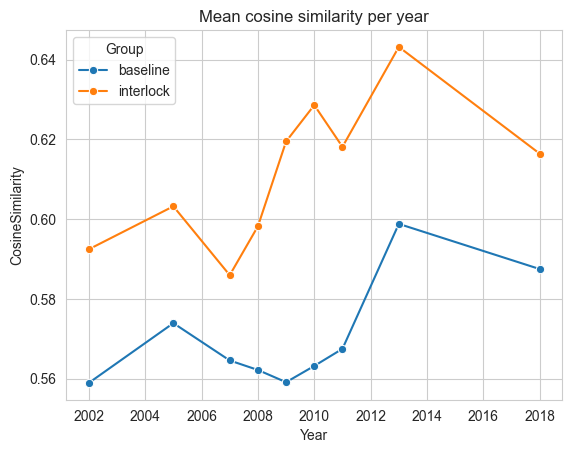

In [13]:
summary = (
    similarity_df.groupby(["Year", "Group"])["CosineSimilarity"]
    .mean()
    .reset_index()
)

sns.lineplot(data=summary, x="Year", y="CosineSimilarity", hue="Group", marker="o")
plt.title("Mean cosine similarity per year")
plt.show()


In [14]:
means = (
    similarity_df.groupby(["Year", "Group"])["CosineSimilarity"]
    .mean()
    .unstack()
)
means["diff"] = means["interlock"] - means["baseline"]
print(means.round(3))


Group  baseline  interlock   diff
Year                             
2002      0.559      0.592  0.034
2005      0.574      0.603  0.029
2007      0.565      0.586  0.021
2008      0.562      0.598  0.036
2009      0.559      0.619  0.060
2010      0.563      0.629  0.065
2011      0.567      0.618  0.051
2013      0.599      0.643  0.044
2018      0.587      0.616  0.029


In [15]:
'''
effect of the difference between means measured in std devs.
'''
def cohens_d(x, y):
    nx, ny = len(x), len(y)
    pooled_std = np.sqrt(((nx - 1)*np.var(x) + (ny - 1)*np.var(y)) / (nx + ny - 2))
    return (np.mean(x) - np.mean(y)) / pooled_std

for yr in years:
    d = cohens_d(
        similarity_df.loc[(similarity_df["Year"] == yr) & (similarity_df["Group"] == "interlock"), "CosineSimilarity"],
        similarity_df.loc[(similarity_df["Year"] == yr) & (similarity_df["Group"] == "baseline"), "CosineSimilarity"]
    )
    print(yr, round(d, 3))


2002 0.139
2005 0.128
2007 0.092
2008 0.15
2009 0.245
2010 0.27
2011 0.208
2013 0.208
2018 0.125


In [16]:
'''
Show significance per year - significant almost every year
'''
results = []
for yr in years:
    base = similarity_df.query("Year == @yr and Group == 'baseline'")["CosineSimilarity"]
    inter = similarity_df.query("Year == @yr and Group == 'interlock'")["CosineSimilarity"]

    t, p = ttest_ind(inter, base, equal_var=False)
    results.append({"Year": yr, "t": t, "p": p})

stats_df = pd.DataFrame(results)
print(stats_df.round(4))


   Year       t       p
0  2002  1.9635  0.0507
1  2005  1.9788  0.0487
2  2007  1.3584  0.1754
3  2008  2.5973  0.0098
4  2009  3.6927  0.0003
5  2010  4.0767  0.0001
6  2011  2.8172  0.0053
7  2013  2.8964  0.0041
8  2018  1.4487  0.1496


In [17]:
# actual numeric separation
means = similarity_df.groupby("Group")["CosineSimilarity"].mean()
stds = similarity_df.groupby("Group")["CosineSimilarity"].std()
print(means, stds, "Δ =", means["interlock"] - means["baseline"])

# overlap index
bins = np.linspace(0,1,50)
b0,_ = np.histogram(similarity_df.loc[similarity_df["Group"]=="baseline","CosineSimilarity"], bins, density=True)
b1,_ = np.histogram(similarity_df.loc[similarity_df["Group"]=="interlock","CosineSimilarity"], bins, density=True)
overlap = np.sum(np.minimum(b0,b1))*(bins[1]-bins[0])
print("Distributional overlap ≈", overlap)


Group
baseline     0.569160
interlock    0.609857
Name: CosineSimilarity, dtype: float64 Group
baseline     0.236326
interlock    0.239105
Name: CosineSimilarity, dtype: float64 Δ = 0.0406968284463739
Distributional overlap ≈ 0.8542958757416002


In [18]:
'''
measure how similar the program dist is before and after the introduction of a board interlock
1 year up and down
'''

records = []           # baseline vs interlock per year
temporal_records = []  # before/after interlock deltas

for yr in years:

    year_nodes = nodes_programs_df.loc[nodes_programs_df["Year"] == yr, ["AffiliationId"] + program_cols].copy()
    year_edges = edge_df.loc[edge_df["Year"] == yr, ["AffiliationId_1", "AffiliationId_2"]].copy()

    # cs for each pair
    X = year_nodes[program_cols].fillna(0).values
    ids = year_nodes["AffiliationId"].values
    cos_mat = cosine_similarity(X)
    cos_df = pd.DataFrame(cos_mat, index=ids, columns=ids)

    # baseline
    idx = np.triu_indices(len(ids), k=1)
    baseline_sims = cos_mat[idx]

    # cs for interlocks
    year_edges[["AffiliationId_1", "AffiliationId_2"]] = np.sort(
        year_edges[["AffiliationId_1", "AffiliationId_2"]].values, axis=1
    )

    cos_long = cos_df.stack().reset_index()
    cos_long.columns = ["AffiliationId_1", "AffiliationId_2", "CosineSimilarity"]
    cos_long[["AffiliationId_1", "AffiliationId_2"]] = np.sort(
        cos_long[["AffiliationId_1", "AffiliationId_2"]].values, axis=1
    )

    merged = year_edges.merge(cos_long, on=["AffiliationId_1", "AffiliationId_2"], how="inner")
    interlock_sims = merged["CosineSimilarity"].to_numpy()

    records.append(pd.DataFrame({
        "Year": yr,
        "Group": "baseline",
        "CosineSimilarity": baseline_sims
    }))
    records.append(pd.DataFrame({
        "Year": yr,
        "Group": "interlock",
        "CosineSimilarity": interlock_sims
    }))

    # find the before and after
    for offset, label in [(-1, "BeforeSim"), (+1, "AfterSim")]:
        comp_year = yr + offset
        comp_nodes = nodes_programs_df.loc[nodes_programs_df["Year"] == comp_year, ["AffiliationId"] + program_cols]
        #first and last years
        if comp_nodes.empty:
            continue

        print(nodes_programs_df.columns)
        print(f"Processing year={yr}, comparison year={comp_year}, num_nodes={len(comp_nodes)}")
        # compute similarity matrix for comp_year
        Xc = comp_nodes[program_cols].fillna(0).values
        idc = comp_nodes["AffiliationId"].values
        cos_c = cosine_similarity(Xc)
        cos_df_c = pd.DataFrame(cos_c, index=idc, columns=idc)

        cos_long_c = cos_df_c.stack().reset_index()
        cos_long_c.columns = ["AffiliationId_1", "AffiliationId_2", label]
        cos_long_c[["AffiliationId_1", "AffiliationId_2"]] = np.sort(
            cos_long_c[["AffiliationId_1", "AffiliationId_2"]].values, axis=1
        )

        # merge to get before/after similarity for edges that appear this year
        merged = year_edges.merge(cos_long_c, on=["AffiliationId_1", "AffiliationId_2"], how="inner")
        merged["Year_event"] = yr
        merged["RelativeYear"] = label
        temporal_records.append(merged)

similarity_df = pd.concat(records, ignore_index=True)

temporal_df = (
    pd.concat(temporal_records, ignore_index=True)
    .pivot_table(index=["AffiliationId_1", "AffiliationId_2", "Year_event"], 
                 columns="RelativeYear", values=["BeforeSim", "AfterSim"])
)

# Flatten columns
temporal_df.columns = [col if isinstance(col, str) else col[1] for col in temporal_df.columns]
temporal_df = temporal_df.reset_index()

# change in similarity after interlock
temporal_df["Delta"] = temporal_df["AfterSim"] - temporal_df["BeforeSim"]


Index(['Year', 'Id', 'Label', 'SystemId', 'degree', 'degree_centrality',
       'eigenvector_centrality', 'betweenness_centrality', 'clustering',
       'modularity_class', 'interlock_entropy_bits', 'strength', 'Institution',
       'AffiliationId', 'carnegie_id', 'year',
       'academics.program_percentage.agriculture',
       'academics.program_percentage.resources',
       'academics.program_percentage.architecture',
       'academics.program_percentage.ethnic_cultural_gender',
       'academics.program_percentage.communication',
       'academics.program_percentage.communications_technology',
       'academics.program_percentage.computer',
       'academics.program_percentage.personal_culinary',
       'academics.program_percentage.education',
       'academics.program_percentage.engineering',
       'academics.program_percentage.engineering_technology',
       'academics.program_percentage.language',
       'academics.program_percentage.family_consumer_science',
       'academics

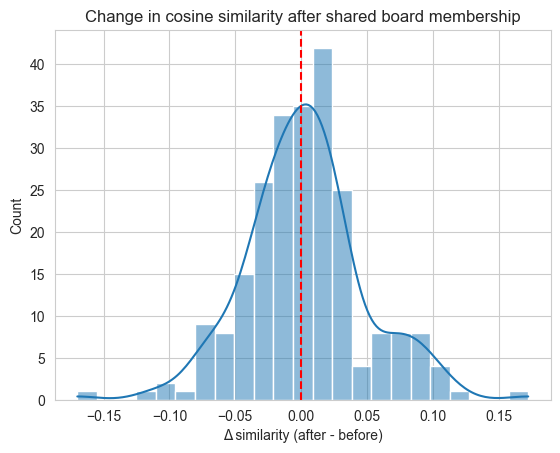

In [19]:
sns.histplot(temporal_df["Delta"], kde=True)
plt.axvline(0, color="red", linestyle="--")
plt.title("Change in cosine similarity after shared board membership")
plt.xlabel("Δ similarity (after - before)")
plt.show()


In [20]:
'''
cs before and after an interlock is lost
'''
loss_records = []

for yr in years:
    next_year = yr + 1
    if next_year not in years:
        continue

    # identify edges that disappear
    edges_t = edge_df.loc[edge_df["Year"] == yr, ["AffiliationId_1", "AffiliationId_2"]].copy()
    edges_t1 = edge_df.loc[edge_df["Year"] == next_year, ["AffiliationId_1", "AffiliationId_2"]].copy()

    if edges_t.empty or edges_t1.empty:
        continue

    # Normalize pair ordering (undirected edges)
    edges_t[["AffiliationId_1", "AffiliationId_2"]] = np.sort(edges_t[["AffiliationId_1", "AffiliationId_2"]].values, axis=1)
    edges_t1[["AffiliationId_1", "AffiliationId_2"]] = np.sort(edges_t1[["AffiliationId_1", "AffiliationId_2"]].values, axis=1)

    # Detect edges that existed in t but not in t+1
    merged = edges_t.merge(edges_t1, on=["AffiliationId_1", "AffiliationId_2"], how="left", indicator=True)
    lost_edges = merged.loc[merged["_merge"] == "left_only", ["AffiliationId_1", "AffiliationId_2"]].drop_duplicates()

    if lost_edges.empty:
        continue

    def get_cosine_df(df_nodes):
        X = df_nodes[program_cols].fillna(0).values
        ids = df_nodes["AffiliationId"].values
        mat = cosine_similarity(X)
        df = pd.DataFrame(mat, index=ids, columns=ids)
        stacked = df.stack().reset_index()
        stacked.columns = ["AffiliationId_1", "AffiliationId_2", "Cosine"]
        return stacked

    # Year t similarities
    nodes_t = nodes_programs_df.loc[nodes_programs_df["Year"] == yr, ["AffiliationId"] + program_cols]
    cos_long_t = get_cosine_df(nodes_t)
    cos_long_t[["AffiliationId_1", "AffiliationId_2"]] = np.sort(cos_long_t[["AffiliationId_1", "AffiliationId_2"]].values, axis=1)

    # Year t+1 similarities
    nodes_t1 = nodes_programs_df.loc[nodes_programs_df["Year"] == next_year, ["AffiliationId"] + program_cols]
    cos_long_t1 = get_cosine_df(nodes_t1)
    cos_long_t1[["AffiliationId_1", "AffiliationId_2"]] = np.sort(cos_long_t1[["AffiliationId_1", "AffiliationId_2"]].values, axis=1)

    lost = (
        lost_edges
        .merge(cos_long_t, on=["AffiliationId_1", "AffiliationId_2"], how="inner")
        .rename(columns={"Cosine": "BeforeLossSim"})
        .merge(cos_long_t1, on=["AffiliationId_1", "AffiliationId_2"], how="inner")
        .rename(columns={"Cosine": "AfterLossSim"})
    )

    if not lost.empty:
        lost["Year_event"] = yr
        lost["Delta"] = lost["AfterLossSim"] - lost["BeforeLossSim"]
        loss_records.append(lost)

loss_df = pd.concat(loss_records, ignore_index=True)


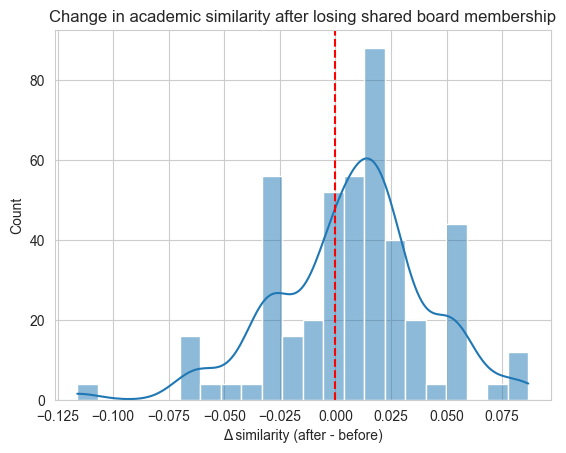

In [21]:
sns.histplot(loss_df["Delta"], kde=True)
plt.axvline(0, color="red", linestyle="--")
plt.title("Change in academic similarity after losing shared board membership")
plt.xlabel("Δ similarity (after - before)")
plt.show()


In [22]:
group1 = similarity_df.loc[similarity_df["Group"]=="interlock","CosineSimilarity"]
group2 = similarity_df.loc[similarity_df["Group"]=="baseline","CosineSimilarity"]

tstat, pval = ttest_ind(group1, group2, equal_var=False)
print("t =", tstat, "p =", pval)


t = 7.5405567363538735 p = 6.682002910877859e-14


In [23]:
mean_diff = group1.mean() - group2.mean()
pooled_sd = np.sqrt(((group1.std()**2) + (group2.std()**2)) / 2)
d = mean_diff / pooled_sd
print("Cohen's d =", d)


Cohen's d = 0.17119694591728873


In [24]:
records = []

for yr in years:
    year_nodes = nodes_programs_df.loc[
        nodes_programs_df["Year"] == yr, ["AffiliationId"] + program_cols
    ].copy()
    year_edges = edge_df.loc[
        edge_df["Year"] == yr, ["AffiliationId_1", "AffiliationId_2"]
    ].copy()


    # --- compute cosine similarity matrix ---
    X = year_nodes[program_cols].fillna(0).values
    ids = year_nodes["AffiliationId"].values
    cos_mat = cosine_similarity(X)

    # --- upper triangle only (unique pairs) ---
    idx = np.triu_indices(len(ids), k=1)
    pairs = pd.DataFrame({
        "AffiliationId_1": ids[idx[0]],
        "AffiliationId_2": ids[idx[1]],
        "CosineSimilarity": cos_mat[idx],
        "Year": yr
    })

    # normalize edge ordering
    year_edges[["AffiliationId_1", "AffiliationId_2"]] = np.sort(
        year_edges[["AffiliationId_1", "AffiliationId_2"]].values, axis=1
    )

    # mark interlocked pairs
    pairs["Interlock"] = pairs.set_index(["AffiliationId_1","AffiliationId_2"]).index.isin(
        year_edges.set_index(["AffiliationId_1","AffiliationId_2"]).index
    ).astype(int)

    records.append(pairs)

pair_df = pd.concat(records, ignore_index=True)

C:\Users\tykun\AppData\Local\Temp\ipykernel_2292\1561982881.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pair_df.groupby("SimBin")["Interlock"]


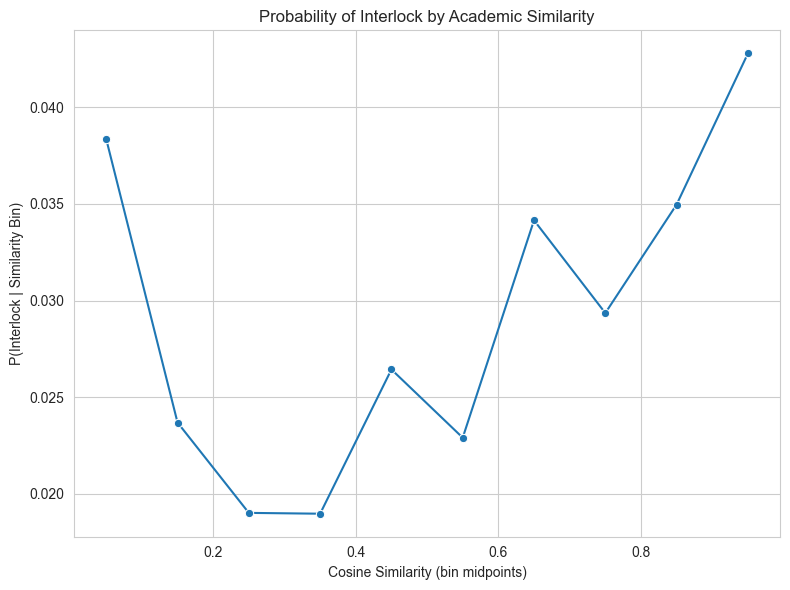

In [25]:
# Bin cosine similarity
pair_df["SimBin"] = pd.cut(pair_df["CosineSimilarity"], bins=np.linspace(0,1,11))
prob_by_bin = (
    pair_df.groupby("SimBin")["Interlock"]
    .mean()
    .reset_index()
)

# Convert interval bins to their midpoint
prob_by_bin["SimBinMid"] = prob_by_bin["SimBin"].apply(lambda x: x.mid if pd.notna(x) else np.nan)

plt.figure(figsize=(8,6))
sns.lineplot(data=prob_by_bin, x="SimBinMid", y="Interlock", marker="o")
plt.xlabel("Cosine Similarity (bin midpoints)")
plt.ylabel("P(Interlock | Similarity Bin)")
plt.title("Probability of Interlock by Academic Similarity")
plt.tight_layout()
plt.show()



In [26]:

model = smf.logit("Interlock ~ CosineSimilarity + C(Year)", data=pair_df).fit(disp=False)
print(model.summary())

odds_ratio = np.exp(model.params["CosineSimilarity"])
print(f"Odds ratio: {odds_ratio:.2f}")


                           Logit Regression Results                           
Dep. Variable:              Interlock   No. Observations:                36049
Model:                          Logit   Df Residuals:                    36039
Method:                           MLE   Df Model:                            9
Date:                Thu, 06 Nov 2025   Pseudo R-squ.:                0.004251
Time:                        23:48:03   Log-Likelihood:                -4646.7
converged:                       True   LL-Null:                       -4666.5
Covariance Type:            nonrobust   LLR p-value:                 8.716e-06
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           -4.1032      0.125    -32.767      0.000      -4.349      -3.858
C(Year)[T.2005]      0.1514      0.127      1.191      0.234      -0.098       0.401
C(Year)[T.2007]      0.1816 

Paired t-test:
  t = 5.493, p = 0.0006
Wilcoxon signed-rank (Interlock > Random):
  W = 45.000, p = 0.0020

Per-year summary (means rounded):
   Year  InterlockMean  RandomMean   Diff
0  2002          0.589       0.552  0.037
1  2005          0.600       0.586  0.014
2  2007          0.583       0.550  0.032
3  2008          0.596       0.579  0.017
4  2009          0.616       0.571  0.045
5  2010          0.623       0.543  0.080
6  2011          0.612       0.574  0.038
7  2013          0.638       0.593  0.045
8  2018          0.616       0.595  0.022


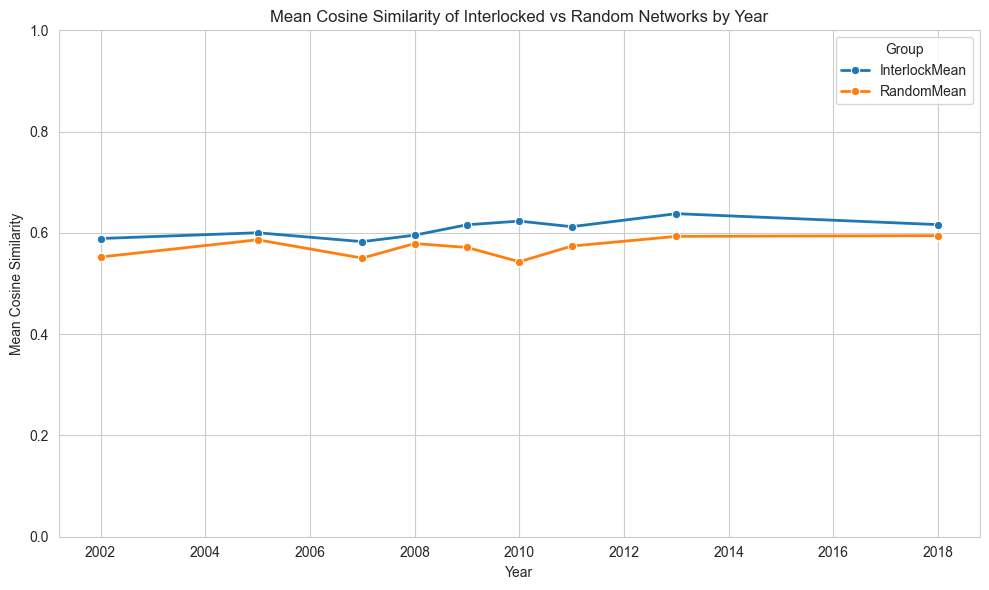

In [27]:
from scipy.stats import ttest_rel, wilcoxon

records = []

for yr in years:
    # --- Subset for this year ---
    year_nodes = nodes_programs_df.loc[
        nodes_programs_df["Year"] == yr, ["AffiliationId"] + program_cols
    ].copy()
    year_edges = edge_df.loc[
        edge_df["Year"] == yr, ["AffiliationId_1", "AffiliationId_2"]
    ].copy()

    if len(year_nodes) < 2 or len(year_edges) == 0:
        continue

    # --- Compute cosine similarity matrix ---
    X = year_nodes[program_cols].fillna(0).values
    ids = year_nodes["AffiliationId"].values
    cos_mat = cosine_similarity(X)

    # Upper triangle for all possible pairs
    idx = np.triu_indices(len(ids), k=1)
    all_pairs = pd.DataFrame({
        "AffiliationId_1": ids[idx[0]],
        "AffiliationId_2": ids[idx[1]],
        "CosineSimilarity": cos_mat[idx]
    })

    # Normalize ordering of IDs in edges
    year_edges[["AffiliationId_1", "AffiliationId_2"]] = np.sort(
        year_edges[["AffiliationId_1", "AffiliationId_2"]].values, axis=1
    )

    # --- Observed similarities (real interlocks) ---
    merged = pd.merge(
        year_edges, all_pairs,
        on=["AffiliationId_1", "AffiliationId_2"],
        how="inner"
    )

    if merged.empty:
        continue

    # --- Random network baseline: same number of edges ---
    n_edges = len(merged)
    random_pairs = all_pairs.sample(n=n_edges, replace=False, random_state=42)

    # Record both means
    records.append({
        "Year": yr,
        "InterlockMean": merged["CosineSimilarity"].mean(),
        "RandomMean": random_pairs["CosineSimilarity"].mean()
    })

# --- Combine and compute difference ---
results = pd.DataFrame(records)
results["Diff"] = results["InterlockMean"] - results["RandomMean"]

# --- Statistical tests ---
# Paired t-test (difference in means across years)
t_stat, p_ttest = ttest_rel(results["InterlockMean"], results["RandomMean"])
# Non-parametric confirmation
w_stat, p_wilcox = wilcoxon(results["InterlockMean"], results["RandomMean"], alternative="greater")

print("Paired t-test:")
print(f"  t = {t_stat:.3f}, p = {p_ttest:.4f}")
print("Wilcoxon signed-rank (Interlock > Random):")
print(f"  W = {w_stat:.3f}, p = {p_wilcox:.4f}\n")

# --- Summary table ---
print("Per-year summary (means rounded):")
print(results.round(3))

# --- Plot ---
plt.figure(figsize=(10,6))
sns.lineplot(data=results.melt(id_vars="Year", value_vars=["InterlockMean","RandomMean"],
                               var_name="Group", value_name="MeanCS"),
             x="Year", y="MeanCS", hue="Group", marker="o", linewidth=2)
plt.title("Mean Cosine Similarity of Interlocked vs Random Networks by Year")
plt.ylabel("Mean Cosine Similarity")
plt.xlabel("Year")
plt.ylim(0, 1)
plt.tight_layout()
plt.show()


In [28]:
stem_cols = [
    'academics.program_percentage.engineering',
    'academics.program_percentage.engineering_technology',
    'academics.program_percentage.computer',
    'academics.program_percentage.science_technology',
    'academics.program_percentage.physical_science',
    'academics.program_percentage.biological',
    'academics.program_percentage.mathematics',
    'academics.program_percentage.agriculture',
    'academics.program_percentage.resources',
    'academics.program_percentage.construction',
    'academics.program_percentage.precision_production',
    'academics.program_percentage.mechanic_repair_technology',
    'academics.program_percentage.transportation'
]
business_cols = [
    'academics.program_percentage.business_marketing',
    'academics.program_percentage.public_administration_social_service',
    'academics.program_percentage.security_law_enforcement',
    'academics.program_percentage.legal'
]

health_cols = [
    'academics.program_percentage.health',
    'academics.program_percentage.parks_recreation_fitness'
]

social_cols = [
    'academics.program_percentage.education',
    'academics.program_percentage.psychology',
    'academics.program_percentage.social_science',
    'academics.program_percentage.multidiscipline',
    'academics.program_percentage.public_administration_social_service'
]


humanities_cols = [
    'academics.program_percentage.english',
    'academics.program_percentage.language',
    'academics.program_percentage.humanities',
    'academics.program_percentage.history',
    'academics.program_percentage.philosophy_religious',
    'academics.program_percentage.theology_religious_vocation',
    'academics.program_percentage.visual_performing',
    'academics.program_percentage.ethnic_cultural_gender',
    'academics.program_percentage.communication',
    'academics.program_percentage.communications_technology',
    'academics.program_percentage.architecture',
    'academics.program_percentage.library'
]

applied_cols = [
    'academics.program_percentage.personal_culinary',
    'academics.program_percentage.family_consumer_science',
    'academics.program_percentage.military'
]


In [29]:
def similarity_stats(df, cols, label):
    X = df[cols].fillna(0).values
    ids = df["Institution"].values
    sim = cosine_similarity(X)
    sim_df = pd.DataFrame(sim, index=ids, columns=ids)
    pairs = sim_df.where(np.triu(np.ones(sim_df.shape), k=1).astype(bool)).stack()
    return {
        "Category": label,
        "Mean": pairs.mean(),
        "Std": pairs.std(),
        "Min": pairs.min(),
        "Max": pairs.max(),
        "Median": pairs.median(),
        "25th": pairs.quantile(0.25),
        "75th": pairs.quantile(0.75)
    }

bins = {
    "STEM": stem_cols,
    "Business": business_cols,
    "Health": health_cols,
    "Social": social_cols,
    "Humanities": humanities_cols,
    "Applied": applied_cols
}


X = nodes_programs_df[subset_cols].fillna(0).values
ids = nodes_programs_df["Institution"].values
cos_sim_df = pd.DataFrame(cosine_similarity(X), index=ids, columns=ids)

# Get upper triangle (excluding diagonal) for unique pairs
pairs = cos_sim_df.where(np.triu(np.ones(cos_sim_df.shape), k=1).astype(bool)).stack()

overall_mean = pairs.mean()
overall_std = pairs.std()
print(f"Overall mean similarity: {overall_mean:.4f}, std: {overall_std:.4f}\n\n\n")


results = [similarity_stats(nodes_programs_df, v, k) for k, v in bins.items()]
summary_df = pd.DataFrame(results)
print(summary_df)

Overall mean similarity: 0.5691, std: 0.2373



     Category      Mean       Std  Min  Max    Median      25th      75th
0        STEM  0.647254  0.287258  0.0  1.0  0.735327  0.459009  0.886355
1    Business  0.722934  0.416872  0.0  1.0  0.978675  0.251353  0.996610
2      Health  0.529665  0.471308  0.0  1.0  0.812015  0.000000  0.996433
3      Social  0.686570  0.292319  0.0  1.0  0.787331  0.516383  0.930056
4  Humanities  0.571280  0.272139  0.0  1.0  0.610083  0.384586  0.794951
5     Applied  0.079139  0.267657  0.0  1.0  0.000000  0.000000  0.000000



=== STEM ===
Paired t-test: t=0.058, p=0.9548
Wilcoxon (Interlock > Baseline): W=17.000, p=0.7520
   Year  InterlockMean  BaselineMean
0  2002          0.588         0.595
1  2005          0.622         0.632
2  2007          0.619         0.629
3  2008          0.621         0.628
4  2009          0.631         0.635
5  2010          0.703         0.671
6  2011          0.643         0.661
7  2013          0.757         0.712
8  2018          0.719         0.736

=== BUSINESS ===
Paired t-test: t=1.014, p=0.3404
Wilcoxon (Interlock > Baseline): W=29.000, p=0.2480
   Year  InterlockMean  BaselineMean
0  2002          0.747         0.729
1  2005          0.746         0.739
2  2007          0.665         0.708
3  2008          0.687         0.707
4  2009          0.679         0.661
5  2010          0.770         0.719
6  2011          0.780         0.725
7  2013          0.809         0.767
8  2018          0.725         0.747

=== HEALTH ===
Paired t-test: t=-0.643, p=0.5384
Wilcoxon

C:\Users\tykun\AppData\Local\Temp\ipykernel_2292\2871993490.py:79: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=combined.melt(id_vars=["Year","Group"],


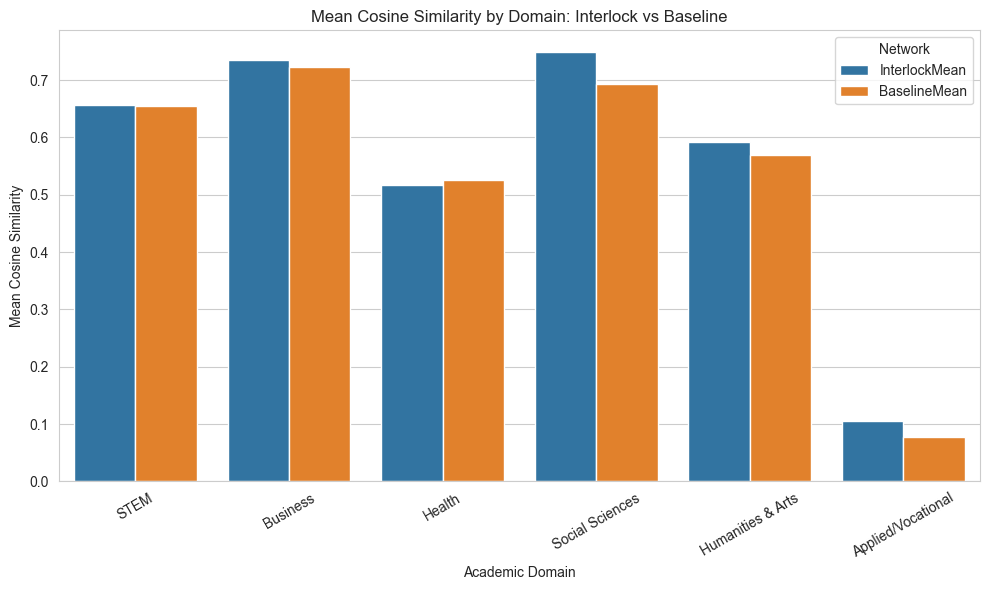

In [30]:
groups = {
    "STEM": stem_cols,
    "Business": business_cols,
    "Health": health_cols,
    "Social Sciences": social_cols,
    "Humanities & Arts": humanities_cols,
    "Applied/Vocational": applied_cols
}

# --- Core comparison function ---
def compare_baseline_vs_interlock(col_subset, subset_name):
    years = sorted(set(edge_df["Year"]) & set(nodes_programs_df["Year"]))
    records = []

    for yr in years:
        year_nodes = nodes_programs_df.loc[
            nodes_programs_df["Year"] == yr, ["AffiliationId"] + col_subset
        ].copy()
        year_edges = edge_df.loc[
            edge_df["Year"] == yr, ["AffiliationId_1", "AffiliationId_2"]
        ].copy()

        if len(year_nodes) < 2 or len(year_edges) == 0:
            continue

        # compute similarity matrix
        X = year_nodes[col_subset].fillna(0).values
        ids = year_nodes["AffiliationId"].values
        cos_mat = cosine_similarity(X)
        cos_df = pd.DataFrame(cos_mat, index=ids, columns=ids)

        # normalize edges
        year_edges[["AffiliationId_1", "AffiliationId_2"]] = np.sort(
            year_edges[["AffiliationId_1", "AffiliationId_2"]].values, axis=1
        )

        # flatten all pairs
        idx = np.triu_indices(len(ids), k=1)
        baseline_sims = cos_mat[idx]
        cos_long = cos_df.stack().reset_index()
        cos_long.columns = ["AffiliationId_1","AffiliationId_2","CosineSimilarity"]
        cos_long[["AffiliationId_1","AffiliationId_2"]] = np.sort(
            cos_long[["AffiliationId_1","AffiliationId_2"]].values, axis=1
        )

        merged = year_edges.merge(cos_long, on=["AffiliationId_1","AffiliationId_2"], how="inner")
        if merged.empty:
            continue

        interlock_mean = merged["CosineSimilarity"].mean()
        baseline_mean = np.mean(baseline_sims)
        records.append({"Year": yr, "InterlockMean": interlock_mean, "BaselineMean": baseline_mean})

    # convert to DataFrame
    df = pd.DataFrame(records)

    # paired tests
    t, p_t = ttest_rel(df["InterlockMean"], df["BaselineMean"])
    w, p_w = wilcoxon(df["InterlockMean"], df["BaselineMean"], alternative="greater")

    print(f"\n=== {subset_name.upper()} ===")
    print(f"Paired t-test: t={t:.3f}, p={p_t:.4f}")
    print(f"Wilcoxon (Interlock > Baseline): W={w:.3f}, p={p_w:.4f}")
    print(df.round(3))
    return df

# --- Run for all subsets ---
results_all = {}
for name, cols in groups.items():
    df = compare_baseline_vs_interlock(cols, name)
    if df is not None:
        df["Group"] = name
        results_all[name] = df

# --- Combine for plotting ---
combined = pd.concat(results_all.values(), ignore_index=True)

plt.figure(figsize=(10,6))
sns.barplot(data=combined.melt(id_vars=["Year","Group"], 
                               value_vars=["InterlockMean","BaselineMean"],
                               var_name="Network", value_name="MeanCS"),
            x="Group", y="MeanCS", hue="Network", ci=None)
plt.title("Mean Cosine Similarity by Domain: Interlock vs Baseline")
plt.ylabel("Mean Cosine Similarity")
plt.xlabel("Academic Domain")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [31]:
edge_df.columns

Index(['Year', 'AffiliationId_1', 'Institution_1', 'AffiliationId_2',
       'Institution_2', 'InterlockCount', 'BoardSize_1', 'BoardSize_2',
       'WeightNorm', 'Weakness', 'Source', 'Target', 'Weight',
       'EdgeEntropyBits'],
      dtype='object')

In [32]:
def build_panel_for_regression(nodes_programs_df, edge_df, program_cols):
    years = sorted(set(nodes_programs_df["Year"]) & set(edge_df["Year"]))
    records = []

    for yr in years:
        year_nodes = nodes_programs_df.loc[nodes_programs_df["Year"] == yr, ["AffiliationId"] + program_cols]
        year_edges = edge_df.loc[edge_df["Year"] == yr, ["AffiliationId_1", "AffiliationId_2", "Weakness"]].copy()

        # compute cosine similarities
        X = year_nodes[program_cols].fillna(0).values
        ids = year_nodes["AffiliationId"].values
        cos_df = pd.DataFrame(cosine_similarity(X), index=ids, columns=ids)

        # reshape to long form
        cos_long = cos_df.stack().reset_index()
        cos_long.columns = ["AffiliationId_1", "AffiliationId_2", "CosineSimilarity"]
        cos_long = cos_long[cos_long["AffiliationId_1"] < cos_long["AffiliationId_2"]]
        cos_long["Year"] = yr

        # aggregate interlocks
        year_edges[["AffiliationId_1","AffiliationId_2"]] = np.sort(
            year_edges[["AffiliationId_1","AffiliationId_2"]].values, axis=1
        )
        interlocks = (
            year_edges.groupby(["AffiliationId_1","AffiliationId_2"])
            .agg(InterlockCount=("Weakness", "size"),
                 Weakness=("Weakness", "mean"))
            .reset_index()
        )

        merged = cos_long.merge(interlocks, on=["AffiliationId_1","AffiliationId_2"], how="left")
        merged["InterlockCount"] = merged["InterlockCount"].fillna(0)
        merged["Weakness"] = merged["Weakness"].fillna(0)
        records.append(merged)

    return pd.concat(records, ignore_index=True)


def run_cs_interlock_regression(df_panel):
    df = df_panel.copy()
    df["Year"] = df["Year"].astype(int)

    # regression in raw units (no standardization)
    model = smf.ols("CosineSimilarity ~ InterlockCount + Weakness + C(Year)", data=df).fit(cov_type="HC3")

    print(model.summary())
    return model


# Example usage
panel_df = build_panel_for_regression(nodes_programs_df, edge_df, program_cols)
reg_model = run_cs_interlock_regression(panel_df)


                            OLS Regression Results                            
Dep. Variable:       CosineSimilarity   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     12.47
Date:                Thu, 06 Nov 2025   Prob (F-statistic):           6.08e-22
Time:                        23:48:05   Log-Likelihood:                 959.84
No. Observations:               36004   AIC:                            -1898.
Df Residuals:                   35993   BIC:                            -1804.
Df Model:                          10                                         
Covariance Type:                  HC3                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           0.5577      0.003    1

In [33]:
results_by_group = {}

for name, cols in groups.items():
    print(f"\n=== {name.upper()} ===")
    df_sub = build_panel_for_regression(nodes_programs_df, edge_df, cols)

    # Standardize within subset
    df_sub["CS_std"] = (df_sub["CosineSimilarity"] - df_sub["CosineSimilarity"].mean()) / df_sub["CosineSimilarity"].std(ddof=0)
    df_sub["InterlockCount_std"] = (df_sub["InterlockCount"] - df_sub["InterlockCount"].mean()) / df_sub["InterlockCount"].std(ddof=0)
    df_sub["Weakness_std"] = (df_sub["Weakness"] - df_sub["Weakness"].mean()) / df_sub["Weakness"].std(ddof=0)

    model = smf.ols("CS_std ~ InterlockCount_std + Weakness_std + C(Year)", data=df_sub).fit(cov_type="HC3")
    results_by_group[name] = model
    print(model.summary().tables[1])  # coefficient table only



=== STEM ===
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             -0.1848      0.014    -13.006      0.000      -0.213      -0.157
C(Year)[T.2005]        0.1267      0.020      6.371      0.000       0.088       0.166
C(Year)[T.2007]        0.1170      0.021      5.582      0.000       0.076       0.158
C(Year)[T.2008]        0.1141      0.020      5.627      0.000       0.074       0.154
C(Year)[T.2009]        0.1385      0.022      6.216      0.000       0.095       0.182
C(Year)[T.2010]        0.2623      0.022     11.866      0.000       0.219       0.306
C(Year)[T.2011]        0.2280      0.023      9.808      0.000       0.182       0.274
C(Year)[T.2013]        0.4072      0.021     19.026      0.000       0.365       0.449
C(Year)[T.2018]        0.4872      0.020     23.936      0.000       0.447       0.527
InterlockCount_std    -0.0349

In [34]:
from linearmodels import PanelOLS

def run_pair_fixed_effects(df_panel):
    df = df_panel.copy()

    # create unique pair id
    df["PairID"] = df["AffiliationId_1"].astype(str) + "_" + df["AffiliationId_2"].astype(str)
    df = df.set_index(["PairID", "Year"])

    # PanelOLS expects numeric columns only
    df = df[["CosineSimilarity", "InterlockCount", "Weakness"]].astype(float)

    # fit FE model with both pair (entity) and year (time) effects
    model = PanelOLS.from_formula(
        "CosineSimilarity ~ InterlockCount + Weakness + EntityEffects + TimeEffects",
        data=df
    ).fit(cov_type="robust")

    print(model.summary)
    return model


# Example usage
fe_model = run_pair_fixed_effects(panel_df)



                          PanelOLS Estimation Summary                           
Dep. Variable:       CosineSimilarity   R-squared:                     3.859e-05
Estimator:                   PanelOLS   R-squared (Between):             -0.0001
No. Observations:               36004   R-squared (Within):            5.577e-05
Date:                Thu, Nov 06 2025   R-squared (Overall):             -0.0002
Time:                        23:48:07   Log-likelihood                 6.355e+04
Cov. Estimator:                Robust                                           
                                        F-statistic:                      0.5330
Entities:                        8371   P-value                           0.5868
Avg Obs:                       4.3010   Distribution:                 F(2,27623)
Min Obs:                       1.0000                                           
Max Obs:                       48.000   F-statistic (robust):             0.4696
                            